### Imputation Model for Glucose Values Out of Measuring Range for Continuous Glucose Monitors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import GPy

from src.data_processing import (
    load_data_ohio,
    apply_quantile_cut,
    get_continuous_segments_loc,
    clean_segment_and_align,
    get_nan_segments_loc,
    remove_small_data_segments,
    resize_segments_uniform
    
)
from src.visualization import (
    plot_patient_data_with_quantile,
    visualize_original_interpolated,
)
from models.baselines import naive_baseline_imputation
from models.gp import train_gpr_sklearn, inference_gpr_sklearn, train_gpr, inference_gpr
from src.bg_statistics import (
    calculate_segment_statistics,
    compare_statistics
)

In [2]:
patient_ids = ['540', '544', '552', '559', '563', '567', '570', '575', '584', '588', '591', '596']
train_data_dict = {}
test_data_dict = {}
all_data_dict = {}
for patient_id in patient_ids:
    _, train_data, test_data, all_data = load_data_ohio(patient_id, include_test=True)
    train_data_dict[patient_id] = train_data
    test_data_dict[patient_id] = test_data
    all_data_dict[patient_id] = all_data

**Calculate 80th percentile from all the data**<br>
We applied an 80th percentile cutoff to each patient's CGM data, simulating the upper detection limit of CGM devices. This threshold is used to reserve higher glucose values for testing, the threshold are saved in a list.

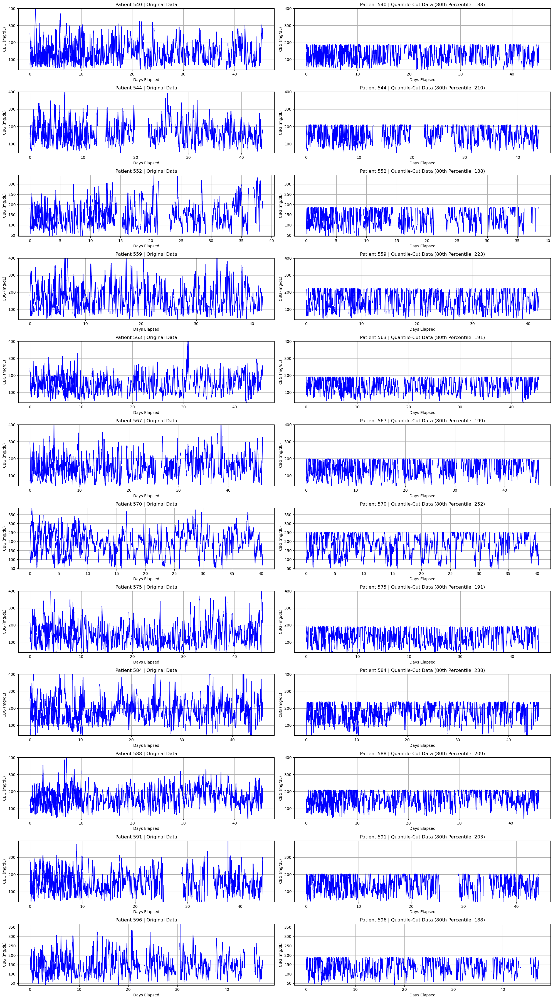

In [3]:
quantile_cut_data, thresh_data = apply_quantile_cut(all_data_dict, nan_above_quantile=0.8)
plot_patient_data_with_quantile(all_data_dict, quantile_cut_data, quantile_cutoff=0.8)

**Segmentation and Visualization** <br>
This process creates two key outputs: <br>
&nbsp;&nbsp;&nbsp;&nbsp;1. Continuous Segments: These are periods where CGM data is continuously recorded without any missing values. Extract all the continuous segments from the data, in order to avoid actual missing data <br> <br>
&nbsp;&nbsp;&nbsp;&nbsp;2. Censor each continuous segment using the 80th percentile calculated using all the data <br> <br>
&nbsp;&nbsp;&nbsp;&nbsp;3. If there are any censored values in the beginning and end of censored segment, we discard these values from the segment <br>
<br>
We have visualized both the continuous CGM data (in blue) and the missing segments (in red) to provide a clear understanding of the data structure and gaps for all 12 patients.


In [4]:
# 1. create continues
cont_segments_dict = {}
nan_segments_dict = {}

for patient_id in patient_ids:
    patient_data = all_data_dict
    cont_segments_loc = get_continuous_segments_loc({patient_id: patient_data[patient_id]}, 'cbg')
    nan_segments_loc = get_nan_segments_loc({patient_id: patient_data[patient_id]}, 'cbg')
    cont_segments_dict[patient_id] = cont_segments_loc[patient_id]  
    nan_segments_dict[patient_id] = nan_segments_loc[patient_id]

segments_stats_df = calculate_segment_statistics(cont_segments_dict, nan_segments_dict)
segments_stats_df

,num_cont_seg,min_cont_length,max_cont_length,70_percent_cont_length,num_nan_seg,min_nan_length,max_nan_length,70_percent_nan_length
540,39.0,24.0,946.0,360.6,38.0,1.0,235.0,18.8
544,30.0,3.0,1704.0,564.3,29.0,1.0,738.0,42.0
552,56.0,10.0,578.0,235.5,55.0,1.0,1415.0,23.8
559,55.0,21.0,1291.0,256.6,54.0,1.0,156.0,33.5
563,26.0,36.0,1726.0,600.0,25.0,1.0,288.0,36.0
567,70.0,7.0,509.0,252.1,69.0,1.0,315.0,35.0
570,31.0,28.0,1632.0,659.0,30.0,1.0,144.0,30.3
575,84.0,9.0,661.0,178.3,83.0,1.0,135.0,11.0
584,76.0,4.0,939.0,246.0,75.0,1.0,202.0,11.8
588,14.0,8.0,1721.0,1652.5,13.0,1.0,151.0,43.6


In [5]:
kept_cont_segments, kept_cont_segments_df = remove_small_data_segments(cont_segments_dict, nan_segments_dict)
kept_cont_segments_df

,Patient ID,70th Percentile NaN Length,Minimum Length to Keep,Num Segments Kept,Segment Lengths Kept
0,540,18.8,118.8,35,"[768, 945, 229, 318, 289, 350, 511, 162, 282, 339, 805, 918, 605, 190, 222, 342, 304, 815, 946, 142, 142, 210, 142, 861, 677, 206, 365, 142, 185, 810, 354, 293, 142, 345, 260]"
1,544,42.0,142.0,19,"[1560, 1704, 1129, 199, 549, 255, 255, 792, 850, 600, 157, 271, 875, 351, 263, 193, 260, 707, 1438]"
2,552,23.8,123.8,45,"[383, 465, 368, 277, 279, 281, 142, 142, 193, 142, 236, 142, 142, 205, 232, 142, 281, 142, 142, 142, 446, 259, 155, 279, 215, 466, 450, 424, 142, 235, 142, 142, 142, 142, 189, 195, 193, 342, 142, 578, 127, 194, 282, 226, 142]"
3,559,33.5,133.5,43,"[228, 958, 237, 186, 412, 141, 142, 142, 346, 142, 258, 142, 178, 565, 400, 141, 1291, 141, 155, 433, 174, 415, 153, 272, 136, 228, 251, 429, 359, 364, 180, 337, 206, 282, 239, 223, 142, 162, 265, 242, 283, 142, 232]"
4,563,36.0,136.0,21,"[142, 1433, 506, 1162, 995, 211, 512, 224, 573, 559, 202, 1726, 1726, 434, 627, 264, 536, 848, 1175, 205, 342]"
5,567,35.0,135.0,53,"[142, 142, 263, 266, 142, 381, 142, 275, 250, 142, 142, 142, 275, 142, 284, 270, 261, 142, 142, 209, 240, 272, 272, 257, 262, 142, 142, 142, 271, 257, 227, 142, 142, 509, 248, 214, 142, 142, 248, 243, 229, 276, 494, 137, 278, 276, 223, 145, 318, 142, 142, 227, 274]"
6,570,30.3,130.3,23,"[1632, 1023, 158, 276, 958, 266, 874, 659, 1028, 685, 846, 226, 141, 1126, 304, 472, 275, 284, 669, 169, 265, 422, 435]"
7,575,11.0,111.0,66,"[169, 142, 285, 142, 142, 141, 474, 278, 142, 140, 223, 142, 371, 284, 141, 142, 142, 141, 225, 141, 142, 410, 141, 424, 277, 142, 141, 142, 142, 269, 281, 181, 207, 142, 142, 142, 142, 141, 145, 178, 142, 141, 142, 283, 283, 142, 142, 141, 262, 262, 142, 142, 141, 142, 142, 281, 142, 661, 142, 275, 141, 333, 142, 201, 286, 325]"
8,584,11.8,111.8,56,"[219, 416, 561, 285, 202, 241, 939, 417, 141, 153, 251, 277, 142, 172, 411, 261, 144, 208, 200, 142, 142, 142, 269, 432, 155, 124, 516, 141, 142, 142, 281, 317, 134, 142, 142, 276, 269, 313, 142, 142, 147, 177, 378, 332, 142, 142, 273, 141, 141, 275, 174, 174, 142, 274, 142, 424]"
9,588,43.6,143.6,11,"[1610, 1556, 1721, 1164, 1684, 1686, 1701, 1308, 401, 1649, 741]"


In [6]:
original_segments = resize_segments_uniform(kept_cont_segments, all_data_dict)
resized_cont_segments_df = calculate_segment_statistics(original_segments, is_resized=True)
resized_cont_segments_df

,num_cont_seg,min_cont_length,max_cont_length,70_percent_cont_length
540,89.0,142.0,142.0,142.0
544,70.0,157.0,157.0,157.0
552,69.0,127.0,127.0,127.0
559,76.0,136.0,136.0,136.0
563,93.0,142.0,142.0,142.0
567,66.0,137.0,137.0,137.0
570,82.0,141.0,141.0,141.0
575,84.0,140.0,140.0,140.0
584,94.0,124.0,124.0,124.0
588,34.0,401.0,401.0,401.0


In [7]:
# 2. censored segments
# Dictionary for storing the interpolated data for each patient
censored_segments = {}

# Assuming 'original_data' is a dictionary with patient data, and each entry is a 1D array of continuous data points
for patient_id, segments in original_segments.items():
    # Store interpolated segments for the current patient
    censored_segments[patient_id] = []
    
    for segment in segments:
        # Extract the segment data between the start and end indices
        has_nan = np.isnan(segment).any()
        # print("Contains NaN values:", has_nan)
        censored_segment = np.where(segment > thresh_data[patient_id], np.nan, segment)
        censored_segments[patient_id].append(censored_segment)
        
# print("All censored segments:", censored_segments)

In [8]:
# 3. clean segments
# Assuming sensored_segments and original_segments are dictionaries containing segments
# Initialize cleaned versions of both dictionaries
cleaned_censored_segments = {}
cleaned_original_segments = {}

# Iterate through each patient in sensored_segments and original_segments
for patient_id in censored_segments.keys():
    # Initialize lists to store cleaned segments
    cleaned_censored_segments[patient_id] = []
    cleaned_original_segments[patient_id] = []
    
    # Process each segment in sensored_segments and original_segments
    for censored_segment, original_segment in zip(censored_segments[patient_id], original_segments[patient_id]):
        cleaned_censored_segment, cleaned_original_segment = clean_segment_and_align(censored_segment, original_segment)
        
        # Append the cleaned segments
        if cleaned_censored_segment.shape[0] != 0 and cleaned_original_segment.shape[0] != 0:
            cleaned_censored_segments[patient_id].append(cleaned_censored_segment)
        if cleaned_original_segment.shape[0] != 0 and cleaned_censored_segment.shape[0] != 0:
            cleaned_original_segments[patient_id].append(cleaned_original_segment)

# Now the cleaned_sensored_segments and cleaned_original_segments dictionaries
# contain segments without leading or trailing NaN values, and they are aligned.
# print("Cleaned Sensored Segments:", cleaned_sensored_segments)
# print("Cleaned Original Segments:", cleaned_original_segments)


**Naive Baseline**<br>
The first model we apply is basic interpolation techniques as a benchmark. We fit the polynomials and cubic splines to the non-missing glucose values and predict the missing values. The following visualizations allow us to assess how well this interpolation predicts missing glucose values for each patient across different segments.

**Second-Degree Polynomial**<br>

In [9]:
interpolated_segments_poly = naive_baseline_imputation(data=cleaned_censored_segments, method='polynomial', order=2)

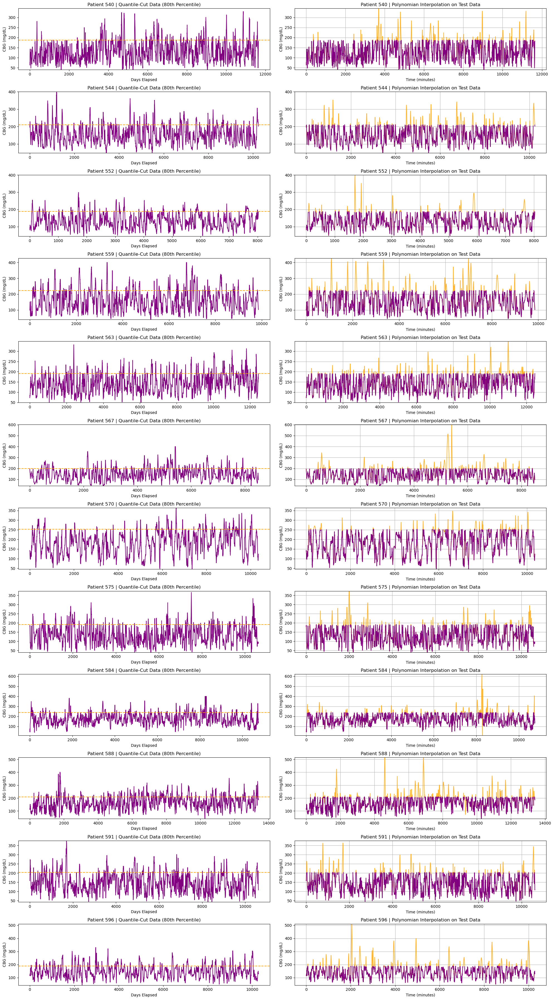

In [10]:
visualize_original_interpolated(interpolated_segments_poly, cleaned_censored_segments, cleaned_original_segments, thresh_data, method_name = 'Polynomian')

**Cubic Splines**<br>

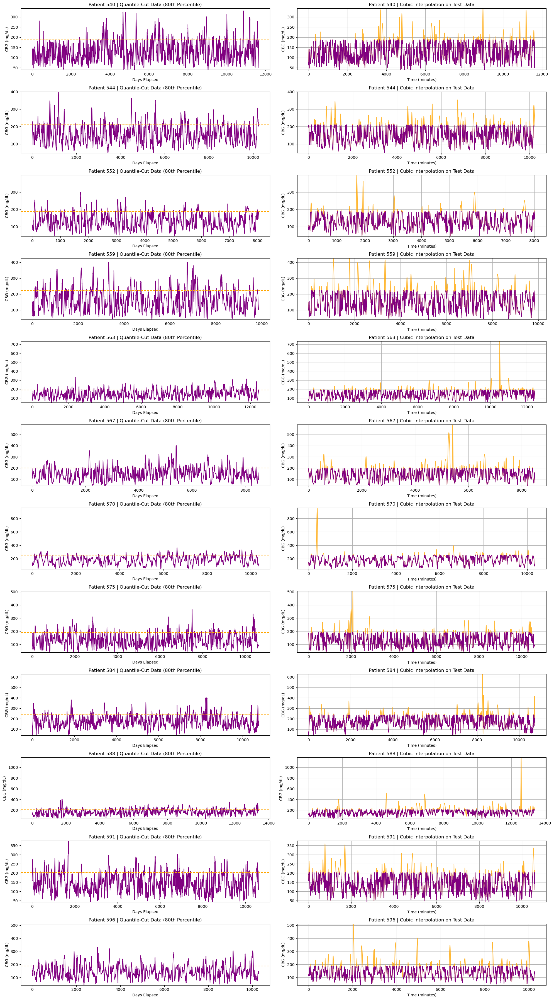

In [11]:
interpolated_segments_cubic = naive_baseline_imputation(data=cleaned_censored_segments, method='cubic')
visualize_original_interpolated(interpolated_segments_cubic, cleaned_censored_segments, cleaned_original_segments, thresh_data, method_name = 'Cubic')

**Ffill**

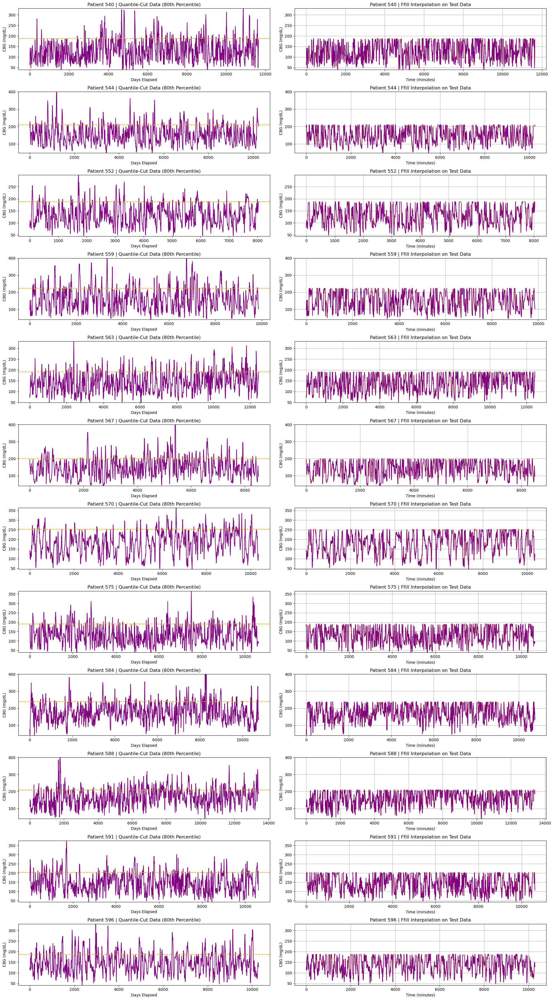

In [12]:
interpolated_segments_ffill = naive_baseline_imputation(data=cleaned_censored_segments, method='ffill')
visualize_original_interpolated(interpolated_segments_ffill, cleaned_censored_segments, cleaned_original_segments, thresh_data, method_name = 'Ffill')

**Common CGM Statistics**<br>
We evaluate the effectiveness of different interpolation methods by comparing key CGM metrics, including the mean and standard deviation of glucose levels before and after imputation. We calculate these statistics for both the original and interpolated data across training and validation sets.

In [13]:
df_poly = compare_statistics(cleaned_original_segments, cleaned_censored_segments, interpolated_segments_poly)
numeric_cols = df_poly.select_dtypes(include='number')
df_poly[numeric_cols.columns] = df_poly.select_dtypes(include='number') * 0.0555
display(df_poly)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-0.775758,0.027669,11.411282,0.077157
1,SD,-0.734046,0.147083,10.313351,1.033494
2,CV,-0.003444,0.000896,0.000227,0.000036


In [14]:
df_cubic = compare_statistics(cleaned_original_segments, cleaned_censored_segments, interpolated_segments_cubic)
numeric_cols = df_cubic.select_dtypes(include='number')
df_cubic[numeric_cols.columns] = df_cubic.select_dtypes(include='number') * 0.0555
display(df_cubic)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-0.775758,0.065595,11.411282,0.167850
1,SD,-0.734046,0.340411,10.313351,4.374560
2,CV,-0.003444,0.001974,0.000227,0.000138


In [15]:
df_ffill = compare_statistics(cleaned_original_segments, cleaned_censored_segments, interpolated_segments_ffill)
numeric_cols = df_ffill.select_dtypes(include='number')
df_ffill[numeric_cols.columns] = df_ffill.select_dtypes(include='number') * 0.0555
display(df_ffill)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-0.775758,-0.298571,11.411282,1.767789
1,SD,-0.734046,-0.538382,10.313351,5.705363
2,CV,-0.003444,-0.003002,0.000227,0.000176


**Gaussian Process Regression**

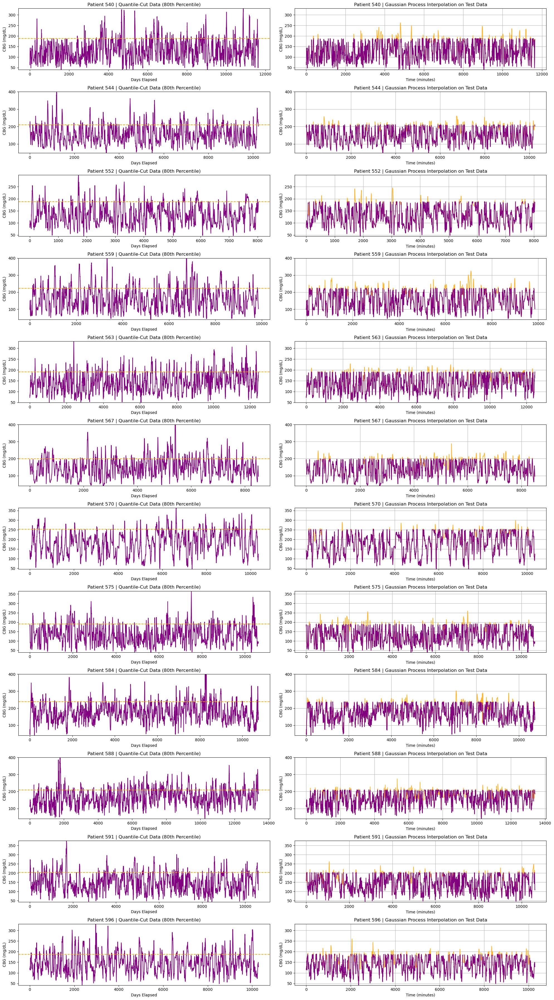

In [16]:
interpolated_segments_gp = {}
for patient_id, segments in cleaned_censored_segments.items():
    interpolated_segments_gp[patient_id] = []
    all_segments = np.concatenate(segments)
    ind_all = np.where(~np.isnan(all_segments))[0]
    all_segments_actual = all_segments[ind_all]
    var = np.std(all_segments_actual)
    mean = np.mean(all_segments_actual)
    for segment in segments:
        # Convert segment to DataFrame to use interpolation functions
        segment_df = pd.DataFrame(segment, columns=['cbg'])

        # Check if there are any NaN values in the segment
        if segment_df['cbg'].isna().any():
            # Only train and infer if there are NaN values
            gpr = train_gpr_sklearn(np.array(segment_df), kernel=None, var=var)
            indices, interpolated_segment, std = inference_gpr_sklearn(np.array(segment_df), gpr)

            # Create a copy of the original segment and replace NaNs with interpolated values
            indices = indices.flatten()  # Ensure `indices` is a flat array
            full_interpolated_segment = np.array(segment_df).flatten().copy()
 
            full_interpolated_segment[indices] = np.array(interpolated_segment).flatten()  # Replace NaNs with interpolated values
            interpolated_segments_gp[patient_id].append(full_interpolated_segment)
            # plt.figure()
            # plt.plot(full_interpolated_segment)
            # plt.plot(np.array(segment_df).flatten().copy())
  
        else:
            # If no NaN values, add the original segment without modification
            interpolated_segments_gp[patient_id].append(np.array(segment_df).flatten())


visualize_original_interpolated(interpolated_segments_gp, cleaned_censored_segments, cleaned_original_segments, thresh_data, method_name = 'Gaussian Process')


In [17]:
df_gp = compare_statistics(cleaned_original_segments, cleaned_censored_segments, interpolated_segments_gp)
numeric_cols = df_gp.select_dtypes(include='number')
df_gp[numeric_cols.columns] = df_gp.select_dtypes(include='number') * 0.0555
display(df_gp)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-0.775758,-0.276638,11.411282,1.599131
1,SD,-0.734046,-0.460202,10.313351,4.218074
2,CV,-0.003444,-0.002502,0.000227,0.000123


 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\paramz\transformations.py:111: RuntimeWarning:overflow encountered in expm1
 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\GPy\kern\src\stationary.py:168: RuntimeWarning:overflow encountered in divide
 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\GPy\kern\src\stationary.py:489: RuntimeWarning:overflow encountered in multiply
 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\GPy\kern\src\stationary.py:489: RuntimeWarning:invalid value encountered in multiply


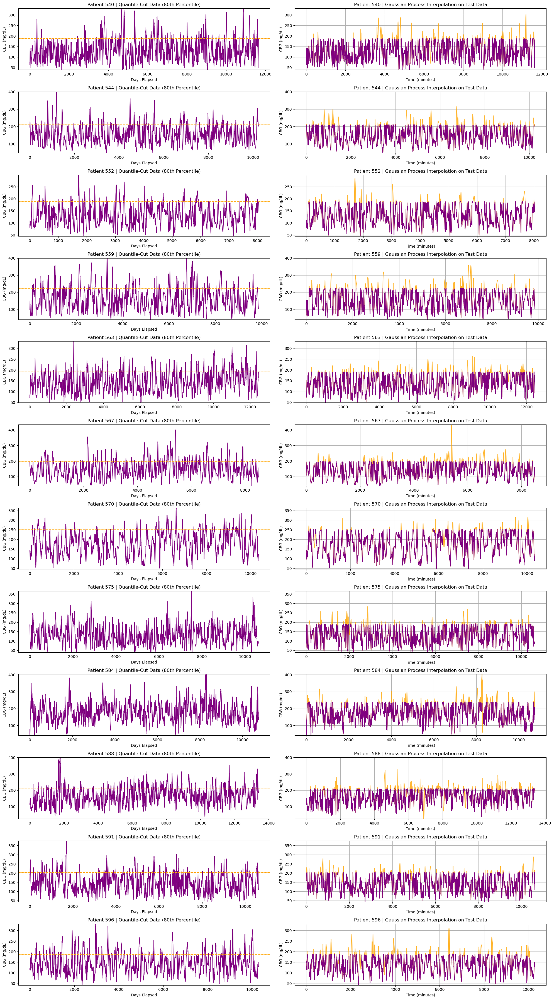

In [18]:
interpolated_segments_gp = {}
for patient_id, segments in cleaned_censored_segments.items():
    interpolated_segments_gp[patient_id] = []
    all_segments = np.concatenate(segments)
    ind_all = np.where(~np.isnan(all_segments))[0]
    all_segments_actual = all_segments[ind_all]
    var = np.std(all_segments_actual)**2
    mean = np.mean(all_segments_actual)
    for segment in segments:
        # Convert segment to DataFrame to use interpolation functions
        segment_df = pd.DataFrame(segment, columns=['cbg'])
        # Check if there are any NaN values in the segment
        if segment_df['cbg'].isna().any():
            # Only train and infer if there are NaN values
            gpr = train_gpr(np.array(segment_df), var=var)
            indices, interpolated_segment, std = inference_gpr(np.array(segment_df), gpr)

            # Create a copy of the original segment and replace NaNs with interpolated values
            indices = indices.flatten()  # Ensure `indices` is a flat array
            full_interpolated_segment = np.array(segment_df).flatten().copy()
 
            full_interpolated_segment[indices] = np.array(interpolated_segment).flatten()  # Replace NaNs with interpolated values
            interpolated_segments_gp[patient_id].append(full_interpolated_segment)
            
            # plt.figure()
            # plt.plot(full_interpolated_segment)
            # plt.plot(np.array(segment_df).flatten().copy())
  
        else:
            # If no NaN values, add the original segment without modification
            interpolated_segments_gp[patient_id].append(np.array(segment_df).flatten())
        

visualize_original_interpolated(interpolated_segments_gp, cleaned_censored_segments, cleaned_original_segments, thresh_data, method_name = 'Gaussian Process')

In [19]:
df_gp = compare_statistics(cleaned_original_segments, cleaned_censored_segments, interpolated_segments_gp)
numeric_cols = df_gp.select_dtypes(include='number')
df_gp[numeric_cols.columns] = df_gp.select_dtypes(include='number') * 0.0555
display(df_gp)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-0.775758,-0.142795,11.411282,0.445269
1,SD,-0.734046,-0.230629,10.313351,1.046907
2,CV,-0.003444,-0.001231,0.000227,0.000030
